In [3]:
import pandas as pd; from fbprophet import Prophet

In [25]:
df=pd.read_csv("hour.csv")

In [33]:
df['dteday'] = pd.to_datetime(df['dteday'])

df['hourly'] = pd.to_datetime(df['dteday']) + (pd.to_timedelta(df['hr'], unit='h'))

In [37]:
df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,hourly
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,2011-01-01 00:00:00
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,2011-01-01 01:00:00
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,2011-01-01 02:00:00
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,2011-01-01 03:00:00
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,2011-01-01 04:00:00


In [30]:
#from datetime import timedelta;
df.dtypes

instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
hr              int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

In [38]:
dcorr=round(df.corr(),2)

In [39]:
dcorr.style.background_gradient(cmap='coolwarm')

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,1,0.4,0.87,0.49,-0,0.01,0,-0,-0.01,0.14,0.14,0.01,-0.07,0.16,0.28,0.28
season,0.4,1,-0.01,0.83,-0.01,-0.01,-0,0.01,-0.01,0.31,0.32,0.15,-0.15,0.12,0.17,0.18
yr,0.87,-0.01,1,-0.01,-0,0.01,-0,-0,-0.02,0.04,0.04,-0.08,-0.01,0.14,0.25,0.25
mnth,0.49,0.83,-0.01,1,-0.01,0.02,0.01,-0,0.01,0.2,0.21,0.16,-0.14,0.07,0.12,0.12
hr,-0,-0.01,-0,-0.01,1,0,-0,0,-0.02,0.14,0.13,-0.28,0.14,0.3,0.37,0.39
holiday,0.01,-0.01,0.01,0.02,0,1,-0.1,-0.25,-0.02,-0.03,-0.03,-0.01,0,0.03,-0.05,-0.03
weekday,0,-0,-0,0.01,-0,-0.1,1,0.04,0,-0,-0.01,-0.04,0.01,0.03,0.02,0.03
workingday,-0,0.01,-0,-0,0,-0.25,0.04,1,0.04,0.06,0.05,0.02,-0.01,-0.3,0.13,0.03
weathersit,-0.01,-0.01,-0.02,0.01,-0.02,-0.02,0,0.04,1,-0.1,-0.11,0.42,0.03,-0.15,-0.12,-0.14
temp,0.14,0.31,0.04,0.2,0.14,-0.03,-0,0.06,-0.1,1,0.99,-0.07,-0.02,0.46,0.34,0.4


In [40]:
df1 = df[['hourly','cnt']]

In [41]:
df1

,hourly,cnt
0,2011-01-01 00:00:00,16
1,2011-01-01 01:00:00,40
2,2011-01-01 02:00:00,32
3,2011-01-01 03:00:00,13
4,2011-01-01 04:00:00,1
...,...,...
17374,2012-12-31 19:00:00,119
17375,2012-12-31 20:00:00,89
17376,2012-12-31 21:00:00,90
17377,2012-12-31 22:00:00,61


In [45]:
df1=df1.rename(columns={"hourly": "ds", "cnt": "y"})

In [46]:
model = Prophet(yearly_seasonality=True,daily_seasonality=True)

In [47]:
model.fit(df1)

In [54]:
future =model.make_future_dataframe(periods=365, freq='H')

In [55]:
forecast =model.predict(future)

In [56]:
# Python
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig = plot_plotly(model, forecast)  # This returns a plotly Figure
py.iplot(fig)

In [59]:
from fbprophet.diagnostics import cross_validation
df_cv=cross_validation(model,horizon='180 days')

INFO:fbprophet:Making 1 forecasts with cutoffs between 2012-07-04 23:00:00 and 2012-07-04 23:00:00


In [60]:
from fbprophet.diagnostics import performance_metrics

In [61]:
df_p=performance_metrics(df_cv);
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,coverage
0,17 days 20:00:00,19471.818655,139.541459,105.453397,1.944592,0.386272,0.735981
1,17 days 21:00:00,19473.817266,139.548620,105.465157,1.942944,0.380948,0.735981
2,17 days 22:00:00,19485.435830,139.590243,105.508280,1.934145,0.380948,0.735981
3,17 days 23:00:00,19467.346971,139.525435,105.385965,1.921734,0.376583,0.735981
4,18 days 00:00:00,19454.050971,139.477779,105.215106,1.896587,0.375529,0.735981


In [67]:
df1[df1['y']<0]

,ds,y


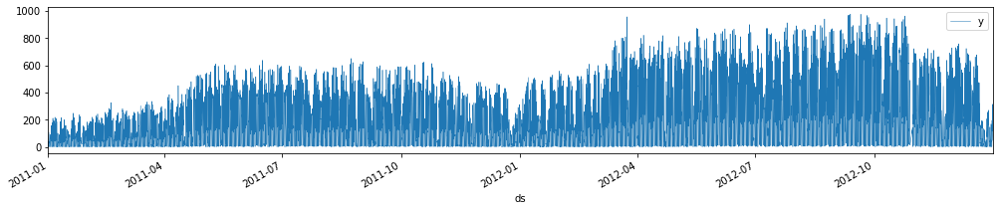

In [81]:
import matplotlib.pyplot as plt
df1.plot.line(y='y',x='ds',figsize=(17,3),lw=.5);

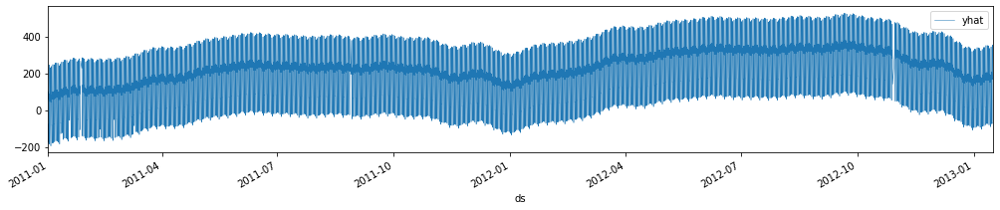

In [82]:
forecast.plot.line(y='yhat',x='ds',figsize=(17,3),lw=.5);

In [99]:
workingdays

,holiday,ds,lower_window,upper_window
47,workingday,2011-01-03 00:00:00,0,1
48,workingday,2011-01-03 01:00:00,0,1
49,workingday,2011-01-03 04:00:00,0,1
50,workingday,2011-01-03 05:00:00,0,1
51,workingday,2011-01-03 06:00:00,0,1
...,...,...,...,...
17374,workingday,2012-12-31 19:00:00,0,1
17375,workingday,2012-12-31 20:00:00,0,1
17376,workingday,2012-12-31 21:00:00,0,1
17377,workingday,2012-12-31 22:00:00,0,1
